In [91]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import math
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import datetime

def is_weekday(date_string):
    date_obj = datetime.datetime.strptime(date_string[:25], "Date: %Y-%m-%d %H:%M:%S")
    return date_obj.weekday() < 5

def get_travel_data(year,depart_hour_range=None,weight_column=None,weekday="All",origin_purp="All",dest_purp="All"):
    df = pd.read_csv("psrc_trips.csv")
    # df = df[(df["d_tract10"].astype(str).str[2:5]=="033")&(df["o_tract10"].astype(str).str[2:5]=="033")]
    df = df[df['depart_time_string'].str[6:10].notna() & df['depart_time_string'].str[17:19].notna()]
    df_2021 = df[(df['depart_time_string'].str[6:10] == str(year))]
    if depart_hour_range != None:
        df_2021 = df_2021[df_2021['depart_time_string'].str[17:19].astype(int).between(*depart_hour_range)]
    df_2021 = df_2021[["o_tract10","d_tract10","origin_purpose_cat","dest_purpose_cat",'depart_time_string',"arrival_time_string","trip_adult_weight_2021","trip_respondent_weight_2021",
                    "trip_weight_2017","trip_weight_2019","trip_weight_2017_2019","trip_adult_weight_2017_2019"]]
    if weight_column == None:
        if year == 2021:
            weight_column = "trip_respondent_weight_2021"
        elif year == 2019:
            weight_column = "trip_weight_2019"
        elif year == 2017:
            weight_column = "trip_weight_2017"
    if weekday=="All":
        pass
    elif weekday==True:
        df_2021 = df_2021[df_2021["depart_time_string"].apply(is_weekday)]
    elif weekday==False:
        df_2021 = df_2021[df_2021["depart_time_string"].apply(is_weekday)]
    if origin_purp=="All":
        pass
    else:
        df_2021 = df_2021[df_2021["origin_purpose_cat"]==origin_purp]
    if dest_purp=="All":
        pass
    else:
        df_2021 = df_2021[df_2021["dest_purpose_cat"]==dest_purp]
    df_2021["d_tract10"] = df_2021["d_tract10"].astype(str).str[:-2]
    df_2021["o_tract10"] = df_2021["o_tract10"].astype(str).str[:-2]
    unique_elements = set(df_2021['o_tract10']).union(set(df_2021['d_tract10']))
    df_2021 = df_2021.groupby(["o_tract10","d_tract10"]).sum(weight_column)
    df_2021 = df_2021.reset_index()
    table_2021 = df_2021.pivot(index='d_tract10', columns='o_tract10', \
                                values=weight_column).reindex(index=unique_elements, \
                                columns=unique_elements, fill_value=0).fillna(0)
    if 'n' in table_2021.index:
        table_2021 = table_2021.drop('n', axis=0)
    if 'n' in table_2021.columns:
        table_2021 = table_2021.drop('n', axis=1)
    table_2021 = table_2021 - table_2021.T
    table_2021_numpy = table_2021.to_numpy()
    table_2021_numpy = np.where(table_2021_numpy < 0, 0, table_2021_numpy)
    non_zero_entries = table_2021_numpy.nonzero()
    non_zero_df = pd.DataFrame({
        'Destination': [table_2021.index[i] for i in non_zero_entries[0]],
        'Origin': [table_2021.columns[i] for i in non_zero_entries[1]],
        'Value': table_2021.to_numpy()[non_zero_entries]
    })
    nodes_list = set(non_zero_df["Destination"]).union(set(non_zero_df["Origin"]))
    edges_dict = {(row[1],row[0]):row[2] for index, row in non_zero_df.iterrows()}
    return nodes_list, edges_dict

def delete_element(lst, i):
    lst.pop(i)
    return lst

def generate_circle_positions(n, radius=5):
    positions = {}
    for i in range(n):
        angle = 2 * math.pi * i / n
        x = radius * math.cos(angle)
        y = radius * math.sin(angle)
        positions[i] = (x, y)
    return positions

def build_graph(nodes,edge_dict):
    internal_nodes_dict = {i:idx+1 for idx,i in enumerate(nodes)}
    internal_edges_dict = {(internal_nodes_dict[edge[0]],internal_nodes_dict[edge[1]]):weight for edge,weight in edge_dict.items()}
    G = nx.Graph()
    G.add_nodes_from(internal_nodes_dict.values())
    for edge in internal_edges_dict.keys():
        src, dst = edge
        weight = internal_edges_dict.get((src, dst))
        if dst > src:
            G.add_edge(src, dst, weight=weight)
        elif dst < src:
            G.add_edge(src, dst, weight=(-1)*weight)
        else:
            pass
    return G, internal_nodes_dict

def get_vertex_by_edge_boundary(G):
    vertices = list(G.nodes)
    edges = list(G.edges)
    vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()
    return vertex_by_edge_boundary,vertices,edges

def get_edge_by_triangle_boundary(G):
    edges = list(G.edges)
    triangles = [tuple(clique) for clique in nx.enumerate_all_cliques(G) if len(clique) == 3]
    edges_dict = {edge:idx for idx,edge in enumerate(edges)}
    triangles_dict = {triangle:idx for idx,triangle in enumerate(triangles)}
    edge_by_triangle_boundary = np.zeros((len(edges), len(triangles)))
    for triangle in triangles:
        col_idx = triangles_dict[triangle]
        edge_by_triangle_boundary[edges_dict[(triangle[1],triangle[2])],col_idx] = 1
        edge_by_triangle_boundary[edges_dict[(triangle[0],triangle[2])],col_idx] = -1
        edge_by_triangle_boundary[edges_dict[(triangle[0],triangle[1])],col_idx] = 1
    return edge_by_triangle_boundary,edges,triangles

def get_k_simplex_by_k_plus_1_simplex_boundary(G,k):
    k_simplicies = [tuple(clique) for clique in nx.enumerate_all_cliques(G) if len(clique) == k+1]
    k_plus_1_simplicies = [tuple(clique) for clique in nx.enumerate_all_cliques(G) if len(clique) == k+2]
    k_simplicies_dict = {k_simplex:idx for idx,k_simplex in enumerate(k_simplicies)}
    k_plus_1_simplicies_dict = {k_plus_1_simplex:idx for idx,k_plus_1_simplex in enumerate(k_plus_1_simplicies)}
    k_simplex_by_k_plus_1_simplex_boundary = np.zeros((len(k_simplicies), len(k_plus_1_simplicies)))
    for k_plus_1_simplex in k_plus_1_simplicies:
        col_idx = k_plus_1_simplicies_dict[k_plus_1_simplex]
        for i in range(len(k_plus_1_simplex)):
            k_simplex_by_k_plus_1_simplex_boundary[k_simplicies_dict[tuple(delete_element(list(k_plus_1_simplex),i))],col_idx] = (-1)**(i)
    return k_simplex_by_k_plus_1_simplex_boundary,k_simplicies,k_plus_1_simplicies

def get_hodge_laplacian(G,k):
    if k == 0:
        k_by_k_plus_1_bdary,k_simplcies,k_plus_1_simplicies = get_k_simplex_by_k_plus_1_simplex_boundary(G,k)
        hodge_laplacian = k_by_k_plus_1_bdary@k_by_k_plus_1_bdary.T
    elif k >= 1:
        k_by_k_plus_1_bdary,k_simplcies,k_plus_1_simplicies = get_k_simplex_by_k_plus_1_simplex_boundary(G,k)
        k_minus_1_by_k_bdary,k_minus_1_simplcies,k_simplicies = get_k_simplex_by_k_plus_1_simplex_boundary(G,k-1)
        hodge_laplacian = k_minus_1_by_k_bdary.T@k_minus_1_by_k_bdary+k_by_k_plus_1_bdary@k_by_k_plus_1_bdary.T
    return hodge_laplacian

def get_graph_laplacian(G):
    return get_hodge_laplacian(G,0)

def get_graph_helmholtzian(G):
    return get_hodge_laplacian(G,1)

def get_graph_hodge_decomposition(nodes,edge_dict):
    G, internal_nodes_dict = build_graph(nodes,edge_dict)
    edge_flows = np.array([data['weight'] for _, _, data in G.edges(data=True)]).T
    vertex_by_edge_boundary,vertices,edges = get_vertex_by_edge_boundary(G)
    edge_by_triangle_boundary,edges,triangles = get_edge_by_triangle_boundary(G)
    graph_helmholtzian = get_graph_helmholtzian(G)
    gradient_component = vertex_by_edge_boundary.T@np.linalg.pinv(vertex_by_edge_boundary.T)@edge_flows
    vertices_potential = np.linalg.pinv(vertex_by_edge_boundary.T)@edge_flows
    vertices_potential = vertices_potential-min(vertices_potential)
    curl_adjoint_component = edge_by_triangle_boundary@np.linalg.pinv(edge_by_triangle_boundary)@edge_flows
    triangles_curl = np.linalg.pinv(edge_by_triangle_boundary)@edge_flows
    graph_helmholtzian_kernel_component = (np.eye(len(edges))-graph_helmholtzian@np.linalg.pinv(graph_helmholtzian))@edge_flows
    three_components = (gradient_component,graph_helmholtzian_kernel_component,curl_adjoint_component)
    three_matrices = (vertex_by_edge_boundary,graph_helmholtzian,edge_by_triangle_boundary)
    return three_components, three_matrices, (vertices_potential,triangles_curl), (vertices,edges,triangles), internal_nodes_dict, edge_flows

def get_graph_closest_potential(nodes,edge_dict):
    G, internal_nodes_dict = build_graph(nodes,edge_dict)
    edge_flows = np.array([data['weight'] for _, _, data in G.edges(data=True)]).T
    vertex_by_edge_boundary,vertices,edges = get_vertex_by_edge_boundary(G)
    gradient_component = vertex_by_edge_boundary.T@np.linalg.pinv(vertex_by_edge_boundary.T)@edge_flows
    vertices_potential = np.linalg.pinv(vertex_by_edge_boundary.T)@edge_flows
    vertices_potential = vertices_potential-min(vertices_potential)
    return gradient_component, vertex_by_edge_boundary, vertices_potential, (vertices,edges), internal_nodes_dict, edge_flows

def plot_urban_potential(year,weight_column=None,depart_hour_range=None,weekday="All",origin_purp="All",dest_purp="All"):
    nodes,edge_dict = get_travel_data(year=year,depart_hour_range=depart_hour_range,weight_column=weight_column,weekday=weekday,origin_purp=origin_purp,dest_purp=dest_purp)
    gradient_component, vertex_by_edge_boundary, vertices_potential, (vertices,edges), internal_nodes_dict, edge_flows = get_graph_closest_potential(nodes,edge_dict)
    reversed_internal_nodes_dict = {val:key for key,val in internal_nodes_dict.items()}
    vertices_potential_dict = {reversed_internal_nodes_dict[idx+1]:val for idx,val in enumerate(vertices_potential)}
    vertices_potential_df = pd.DataFrame({
            'Census Tract': vertices_potential_dict.keys(),
            'Potential': vertices_potential_dict.values()
        })
    shapefile_path = 'census tracts 2010/tract10.shp'
    gdf_10 = gpd.read_file(shapefile_path)
    gdf_10 = gdf_10[gdf_10["GEOID10"].isin(vertices_potential_dict.keys())]
    gdf_10['XCOORD'] = gdf_10.geometry.centroid.x
    gdf_10['YCOORD'] = gdf_10.geometry.centroid.y
    gdf_10_2 = gdf_10.merge(vertices_potential_df, left_on="GEOID10", right_on="Census Tract")
    cmap = plt.get_cmap('viridis')  # Change to the colormap you prefer
    potential_vals = list(vertices_potential_dict.values())
    norm = Normalize(vmin=np.quantile(potential_vals, 0.1), vmax=np.quantile(potential_vals, 0.9))
    gdf_10_2.plot(figsize=(12, 11),column="Potential", cmap=cmap, norm=norm, edgecolor='none', legend=True)
    if depart_hour_range != None:
        plt.title(f"{str(year)} {str(depart_hour_range[0])}:00:00 to {str(depart_hour_range[1])}:00:00 Census Tract Potentials (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    else:
        plt.title(f"{str(year)} Census Tract Potentials (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    plt.show()
    plt.figure(figsize=(8, 6))
    plt.hist(vertices_potential_dict.values(), bins=300, color='blue', edgecolor='black')
    if depart_hour_range != None:
        plt.title(f"Histogram of Census Tract Potential Values {str(year)} {str(depart_hour_range[0])}:00:00 to {str(depart_hour_range[1])}:00:00 (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    else:
        plt.title(f"Histogram of Census Tract Potential Values {str(year)} (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    plt.xlabel("Census Tract Potential Value")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

def plot_urban_divergence(year,weight_column=None,depart_hour_range=None,weekday="All",origin_purp="All",dest_purp="All"):
    nodes,edge_dict = get_travel_data(year=year,depart_hour_range=depart_hour_range,weight_column=weight_column,weekday=weekday,origin_purp=origin_purp,dest_purp=dest_purp)
    gradient_component, vertex_by_edge_boundary, vertices_potential, (vertices,edges), internal_nodes_dict, edge_flows = get_graph_closest_potential(nodes,edge_dict)
    vertices_divergence = vertex_by_edge_boundary@gradient_component
    reversed_internal_nodes_dict = {val:key for key,val in internal_nodes_dict.items()}
    vertices_divergence_dict = {reversed_internal_nodes_dict[idx+1]:val for idx,val in enumerate(vertices_divergence)}
    vertices_divergence_df = pd.DataFrame({
            'Census Tract': vertices_divergence_dict.keys(),
            'Divergence': vertices_divergence_dict.values()
        })
    shapefile_path = 'census tracts 2010/tract10.shp'
    gdf_10 = gpd.read_file(shapefile_path)
    gdf_10 = gdf_10[gdf_10["GEOID10"].isin(vertices_divergence_dict.keys())]
    gdf_10['XCOORD'] = gdf_10.geometry.centroid.x
    gdf_10['YCOORD'] = gdf_10.geometry.centroid.y
    gdf_10_2 = gdf_10.merge(vertices_divergence_df, left_on="GEOID10", right_on="Census Tract")
    cmap = plt.get_cmap('viridis')  # Change to the colormap you prefer
    divergence_vals = list(vertices_divergence_dict.values())
    norm = Normalize(vmin=np.quantile(divergence_vals, 0.1), vmax=np.quantile(divergence_vals, 0.9))
    gdf_10_2.plot(figsize=(12, 11),column="Divergence", cmap=cmap, norm=norm, edgecolor='none', legend=True)
    if depart_hour_range != None:
        plt.title(f"{str(year)} {str(depart_hour_range[0])}:00:00 to {str(depart_hour_range[1])}:00:00 Census Tract Divergences (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    else:
        plt.title(f"{str(year)} Census Tract Divergences (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    plt.show()
    plt.figure(figsize=(8, 6))
    plt.hist(vertices_divergence_dict.values(), bins=300, color='blue', edgecolor='black')
    if depart_hour_range != None:
        plt.title(f"Histogram of Census Tract Divergence Values {str(year)} {str(depart_hour_range[0])}:00:00 to {str(depart_hour_range[1])}:00:00 (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    else:
        plt.title(f"Histogram of Census Tract Divergence Values {str(year)} (weekday={weekday},origin_purp={origin_purp},dest_purp={dest_purp})")
    plt.xlabel("Census Tract Divergence Value")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

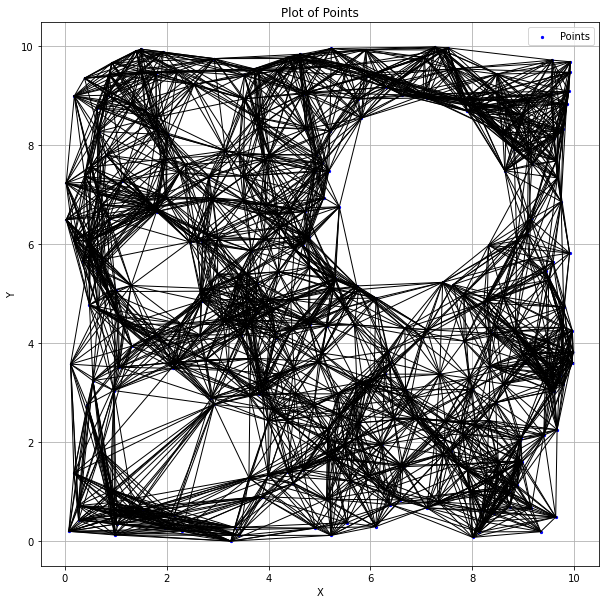

In [89]:
from scipy.spatial import distance
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import kneighbors_graph

def generate_random_points(k, side_length, centers, radii):
    x_coordinates = np.random.uniform(0, side_length, k)
    y_coordinates = np.random.uniform(0, side_length, k)
    points = np.column_stack((x_coordinates, y_coordinates))
    mask = np.array([True]*points.shape[0])
    for center, radius in list(zip(centers, radii)):
        mask = mask&(np.sum((points - np.array(center))**2,axis=1)>radius**2)
    points = points[mask,:]
    return points

num_points = 400
n_neighbors = 25
p = 0.8
# points = generate_random_points(k=num_points, side_length=10, centers=[(2,2),(3,7),(7,7)], radii=[1,1.2,1.6])
points = generate_random_points(k=num_points, side_length=10, centers=[(2,2),(7,7)], radii=[1.2,1.6])
# points = generate_random_points(k=num_points, side_length=10, centers=[(5,5)], radii=[1.5])
knn_adjacency_matrix = kneighbors_graph(points, n_neighbors=n_neighbors, mode='connectivity', include_self=False)
indices = np.where(np.tril(knn_adjacency_matrix.toarray() == 1, k=-1))
indices_list = np.array(list(zip(indices[0],indices[1])))
rows_to_delete = np.random.choice(indices_list.shape[0], size=int(indices_list.shape[0]*0.1), replace=False)
indices_list = np.delete(indices_list, rows_to_delete, axis=0)
plt.figure(figsize=(10, 10))
plt.scatter(points[:,0], points[:,1], color='blue', label='Points', s=5)
for idx in indices_list:
    x1,y1 = points[idx[0],:]
    x2,y2 = points[idx[1],:]
    plt.plot([x1, x2], [y1, y2], linewidth=1, color='black', marker='')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Plot of Points')
plt.legend()
plt.grid(True)
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


dimension of kernel of graph helmholtzian:  1
smallest 5 eigenvalues: [-3.713701915361293e-14, 0.06448393501304171, 0.12283568522704608, 0.22573995127961385, 0.332718024465609]


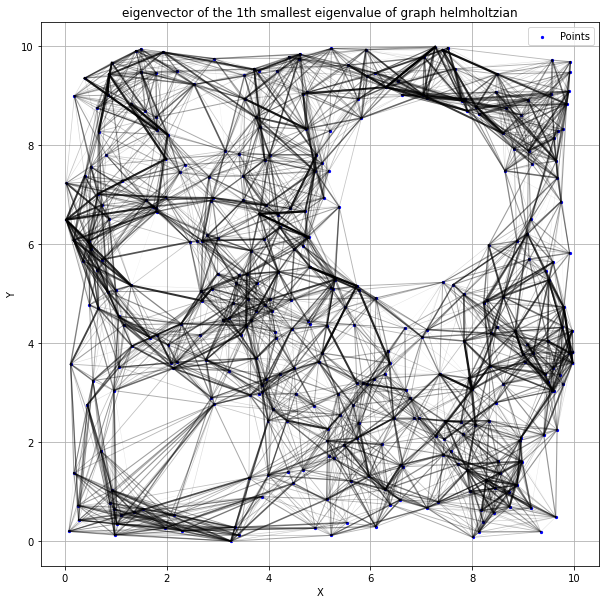

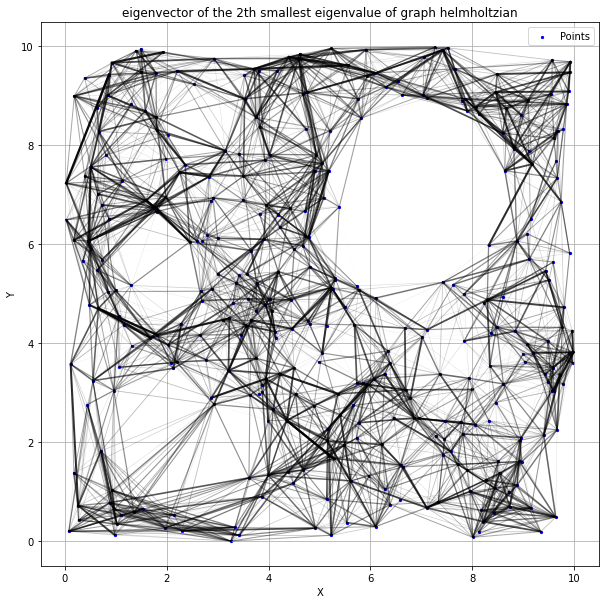

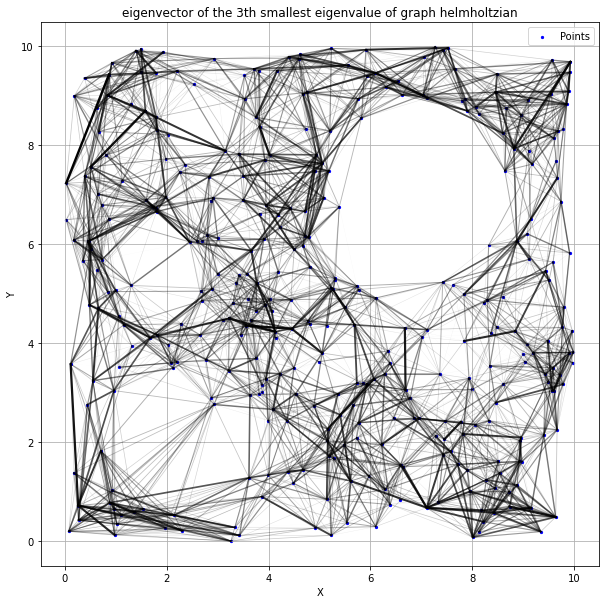

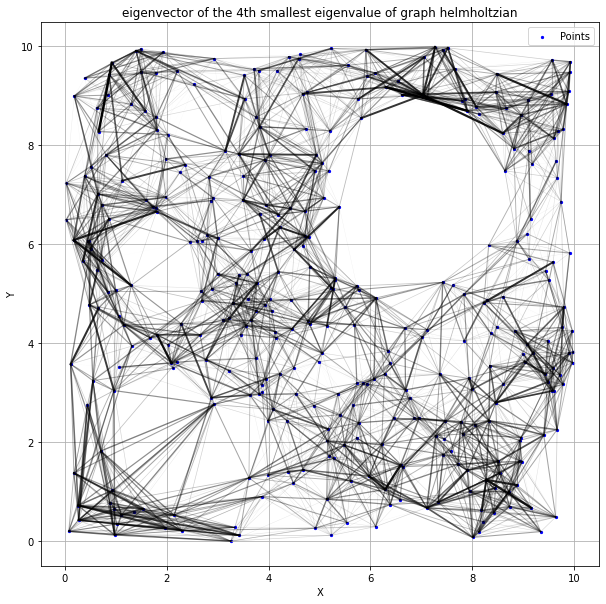

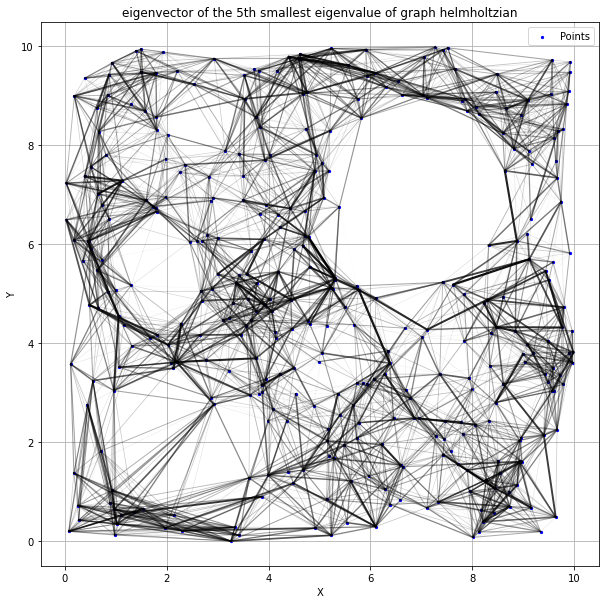

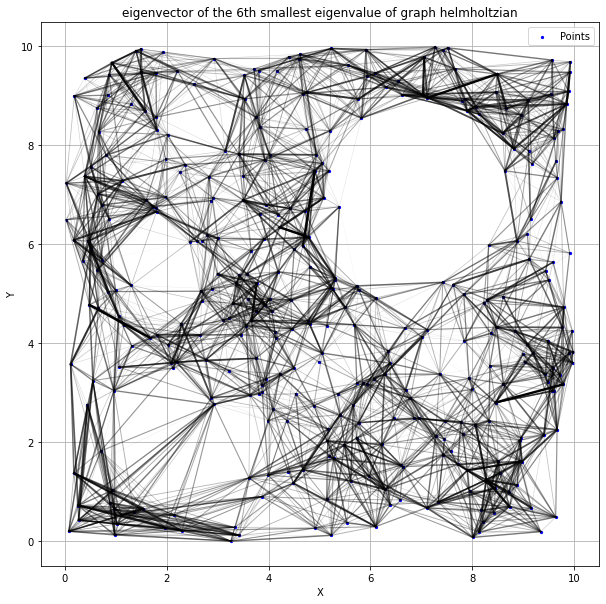

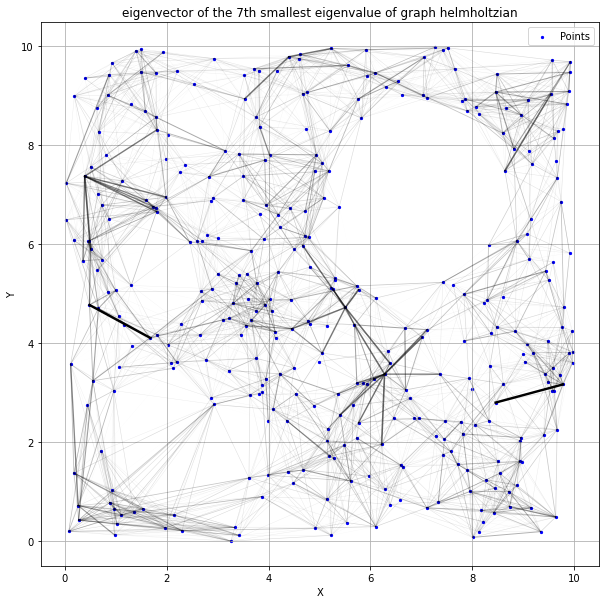

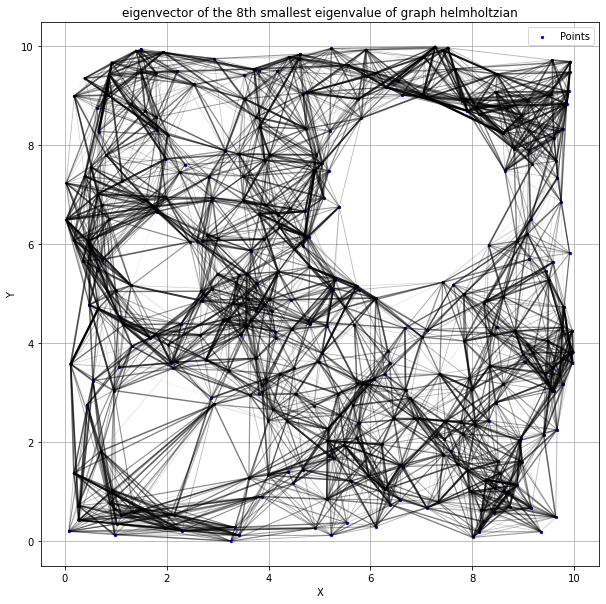

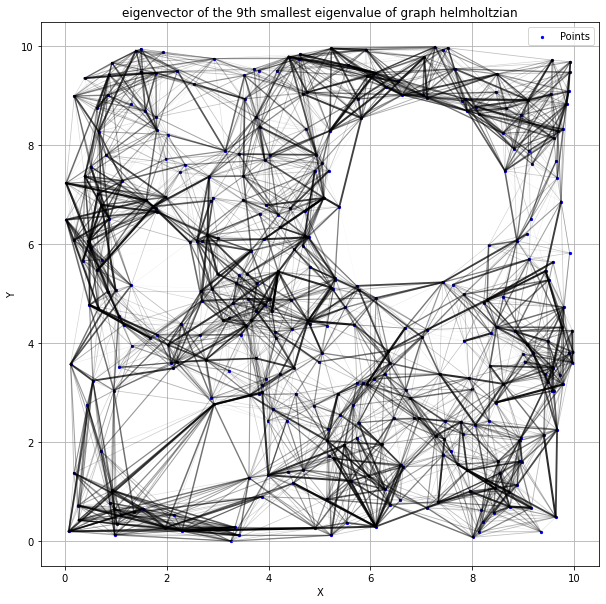

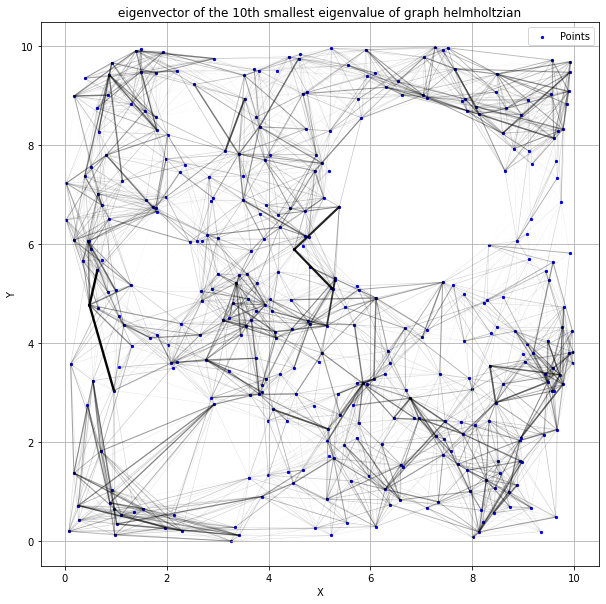

In [90]:
three_components, three_matrices, (vertices_potential,triangles_curl), (vertices,edges,triangles), internal_nodes_dict, edge_flows = \
    get_graph_hodge_decomposition(list(set(indices_list[:,0]).union(set(indices_list[:,1]))),{tuple(i):1 for i in indices_list})
vertex_by_edge_boundary,graph_helmholtzian,edge_by_triangle_boundary = three_matrices
gradient_component,graph_helmholtzian_kernel_component,curl_adjoint_component = three_components
eigenvalues, eigenvectors = np.linalg.eig(graph_helmholtzian)
print("dimension of kernel of graph helmholtzian: ",sum(np.isclose(eigenvalues,0)))
print("smallest 5 eigenvalues:",list(eigenvalues[np.argsort(np.abs(eigenvalues))[:5]]))
for i in range(10):
    edge_vals = np.abs(eigenvectors[:,np.argsort(eigenvalues)[i]])**(1/2)
    max_edge_vals = max(edge_vals)
    plt.figure(figsize=(10, 10))
    plt.scatter(points[:,0], points[:,1], color='blue', label='Points', s=5)
    for j,idx in enumerate(indices_list):
        edge_val = edge_vals[j]/max_edge_vals
        x1,y1 = points[idx[0],:]
        x2,y2 = points[idx[1],:]
        plt.plot([x1, x2], [y1, y2], linewidth=0.3+0.7*edge_val*3, color='black', alpha=edge_val, marker='')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title(f'eigenvector of the {str(i+1)}th smallest eigenvalue of graph helmholtzian')
    plt.legend()
    plt.grid(True)
    plt.show()

In [11]:
graph_helmholtzian

array([[ 6.,  1.,  0., ...,  0.,  0.,  0.],
       [ 1.,  6.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  9., ...,  0.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ..., 14.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  6.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0., 11.]])

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


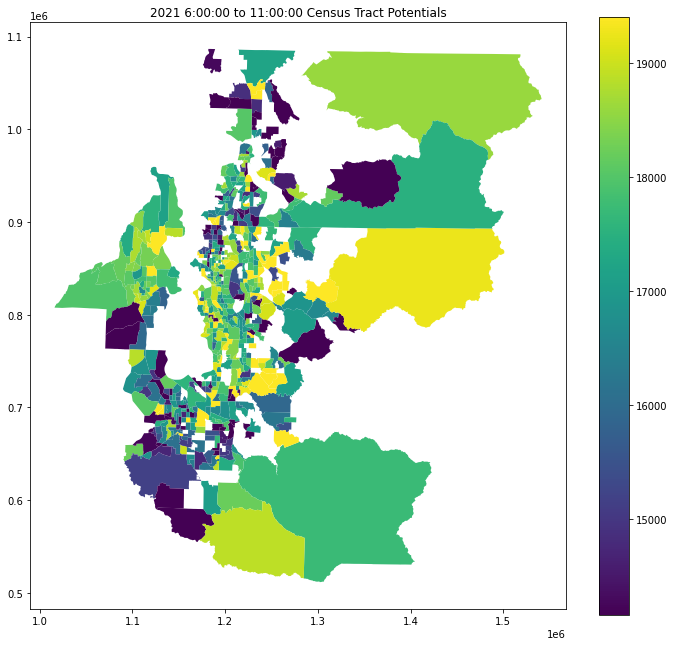

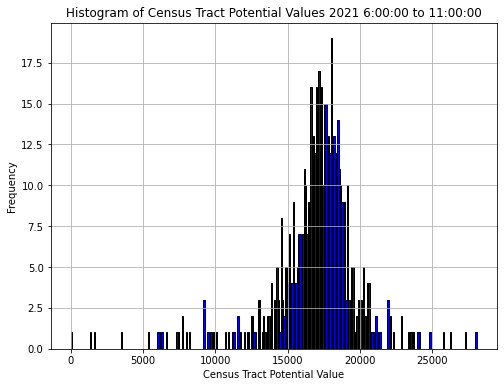

In [28]:
plot_urban_potential(year=2021,depart_hour_range=[6,11],weight_column="trip_respondent_weight_2021")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


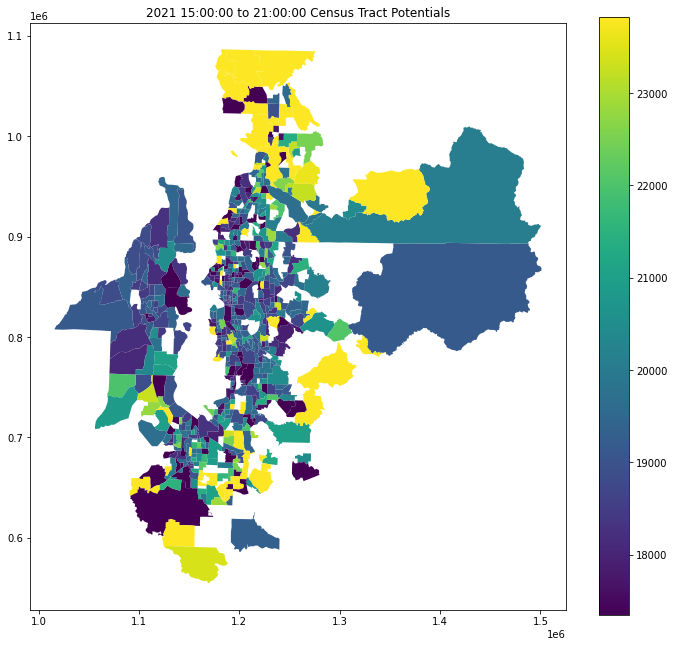

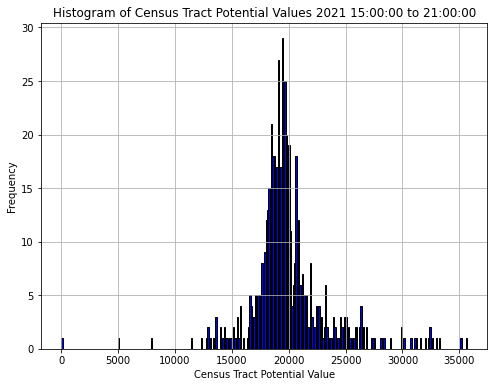

In [29]:
plot_urban_potential(year=2021,depart_hour_range=[15,21],weight_column="trip_respondent_weight_2021")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


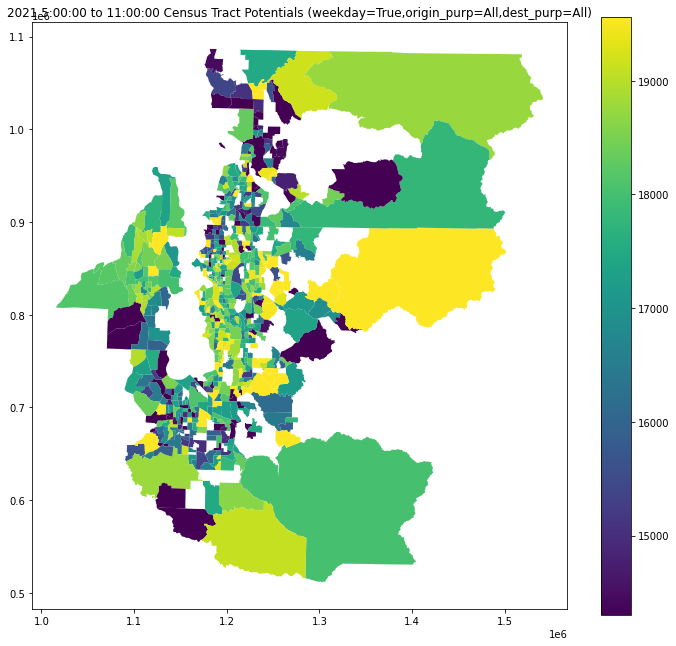

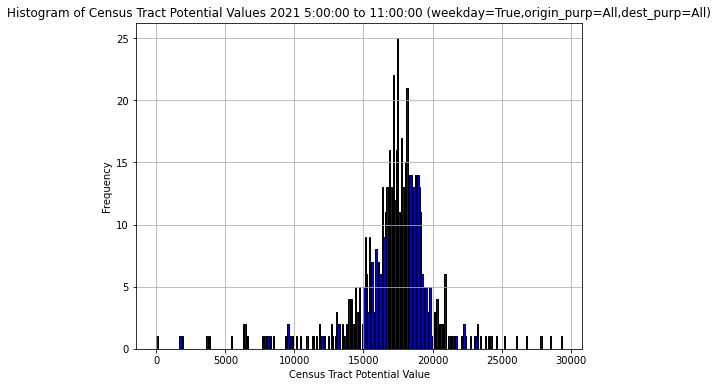

In [62]:
plot_urban_potential(year=2021,weight_column=None,depart_hour_range=[5,11],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


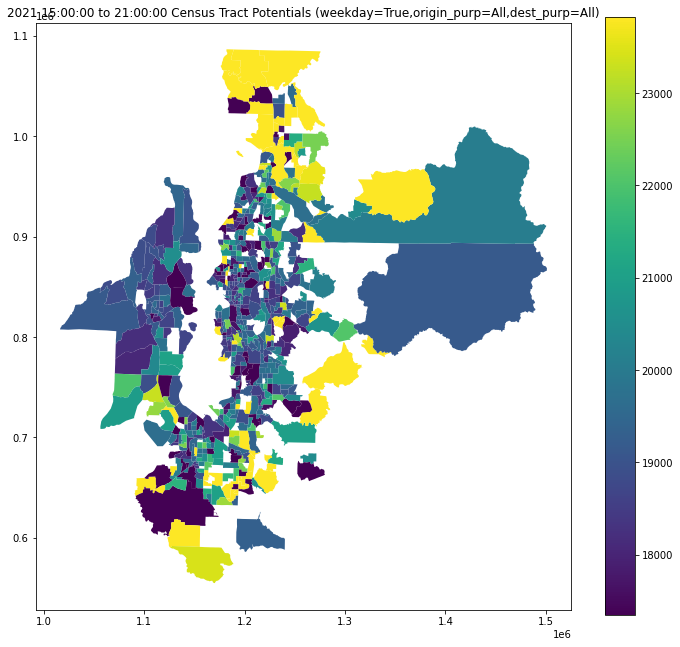

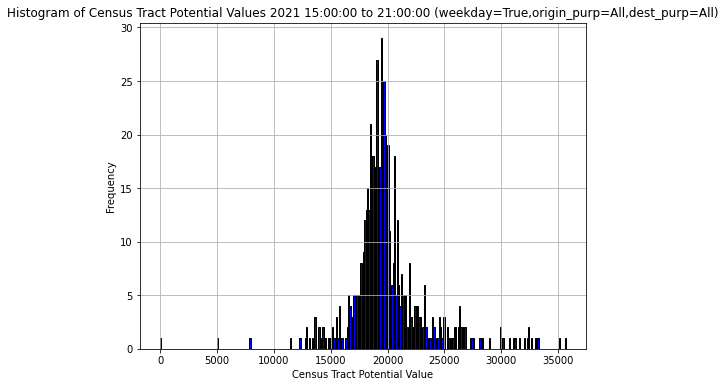

In [63]:
plot_urban_potential(year=2021,weight_column=None,depart_hour_range=[15,21],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


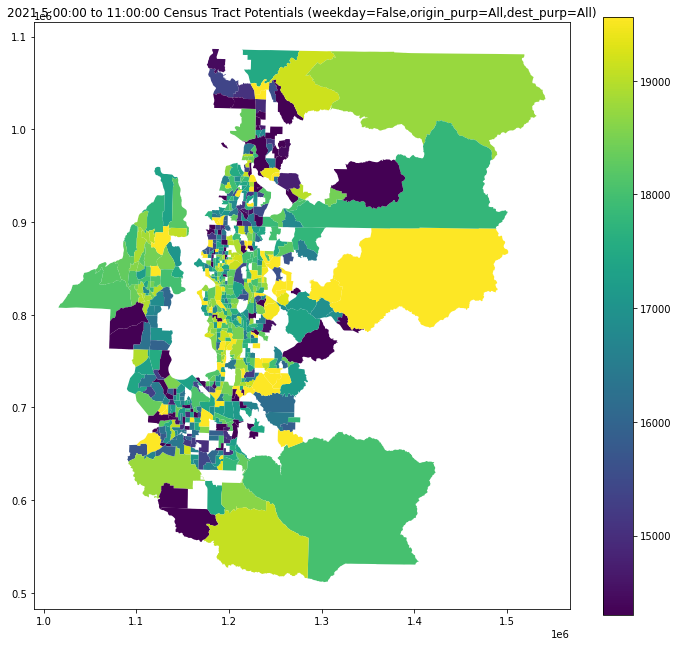

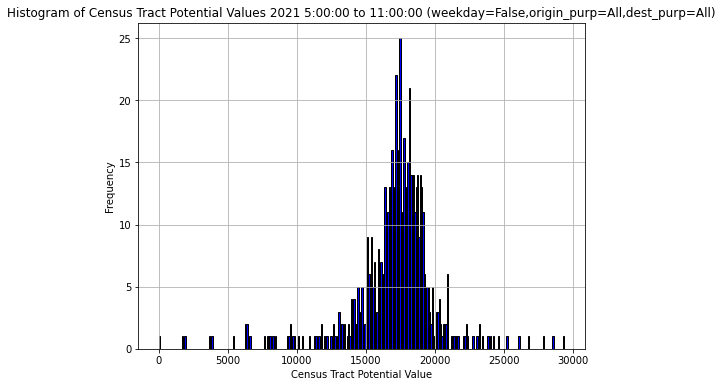

In [64]:
plot_urban_potential(year=2021,weight_column=None,depart_hour_range=[5,11],weekday=False,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


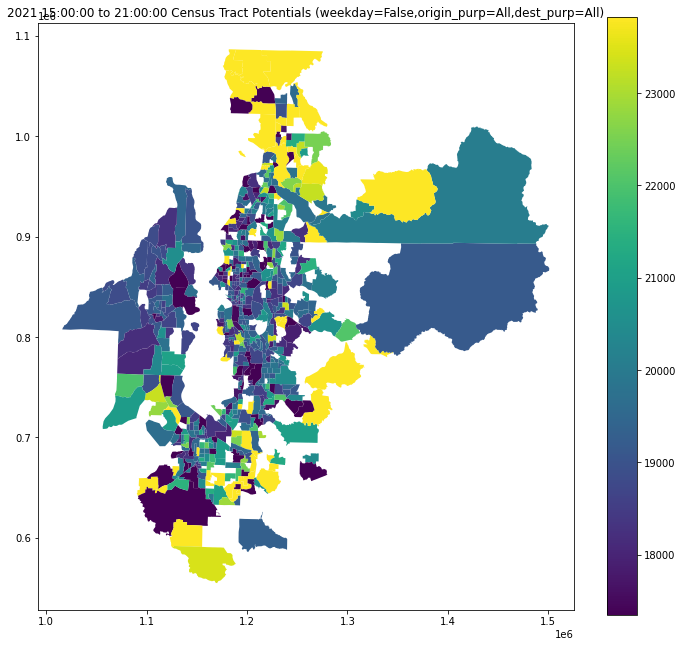

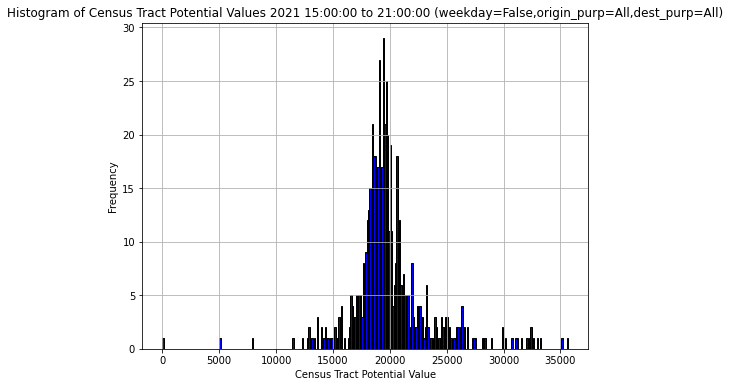

In [65]:
plot_urban_potential(year=2021,weight_column=None,depart_hour_range=[15,21],weekday=False,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


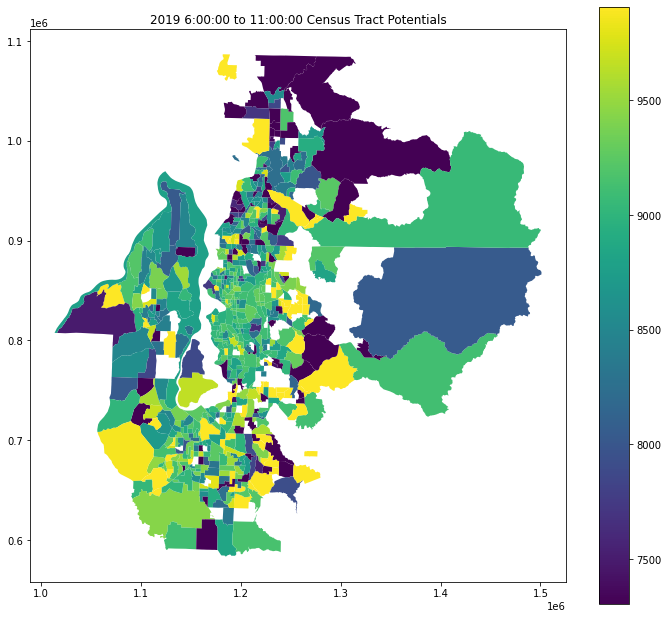

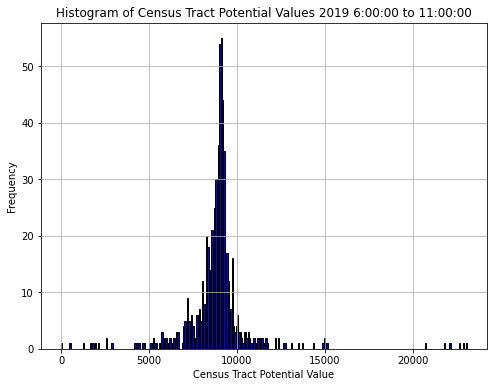

In [22]:
plot_urban_potential(year=2019,depart_hour_range=[6,11],weight_column="trip_weight_2019")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


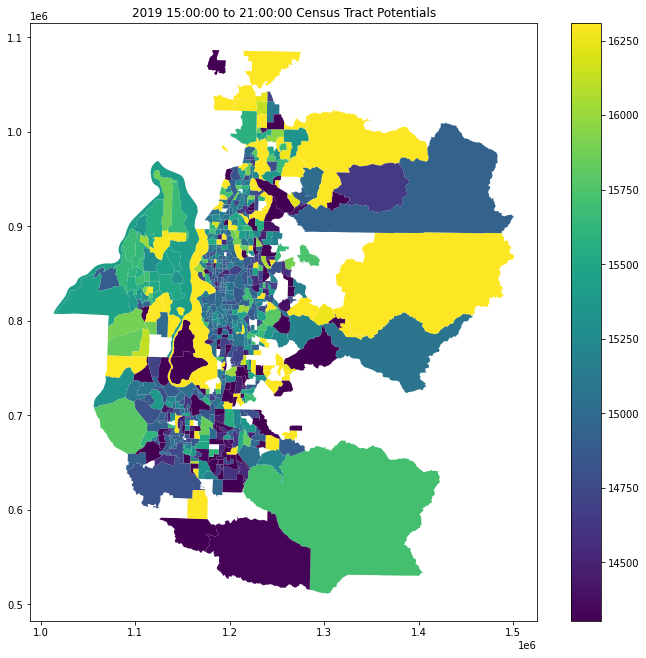

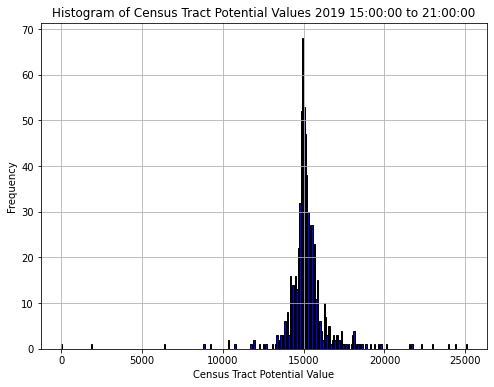

In [23]:
plot_urban_potential(year=2019,depart_hour_range=[15,21],weight_column="trip_weight_2019")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\1343888822.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\1343888822.py:104: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


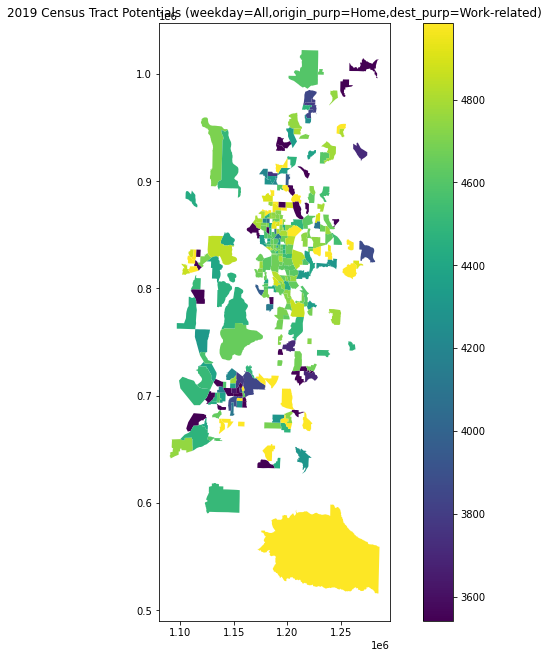

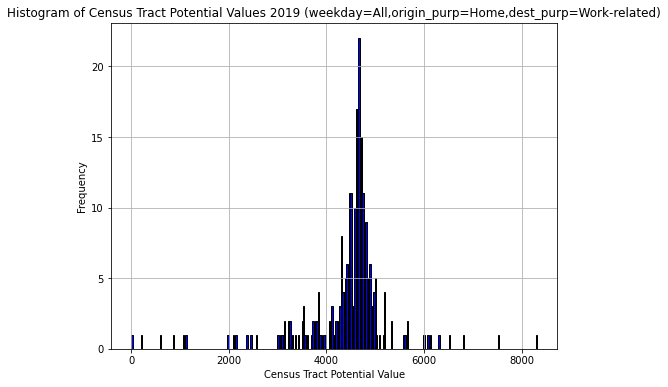

In [41]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=None,weekday="All",origin_purp="Home",dest_purp="Work-related")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\1343888822.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\1343888822.py:104: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


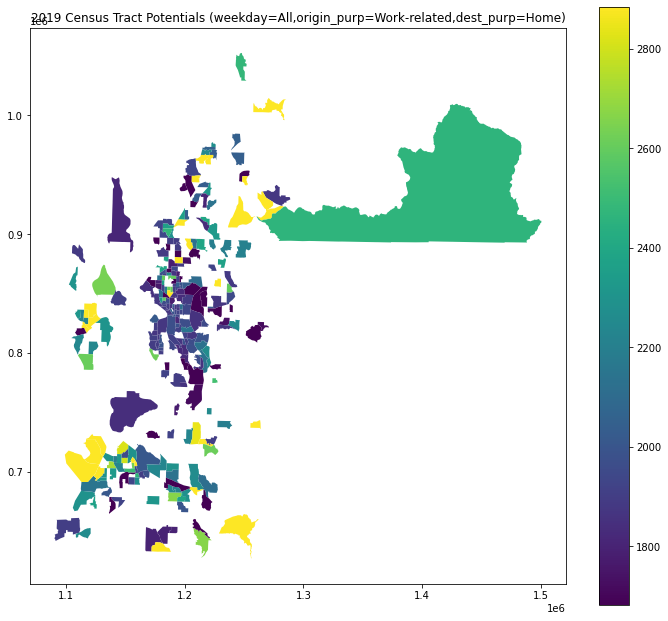

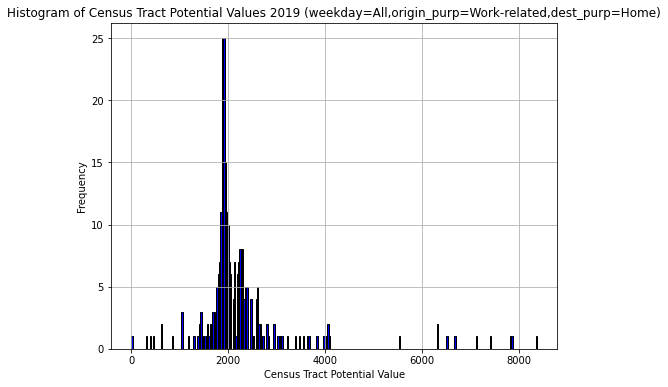

In [42]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=None,weekday="All",origin_purp="Work-related",dest_purp="Home")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


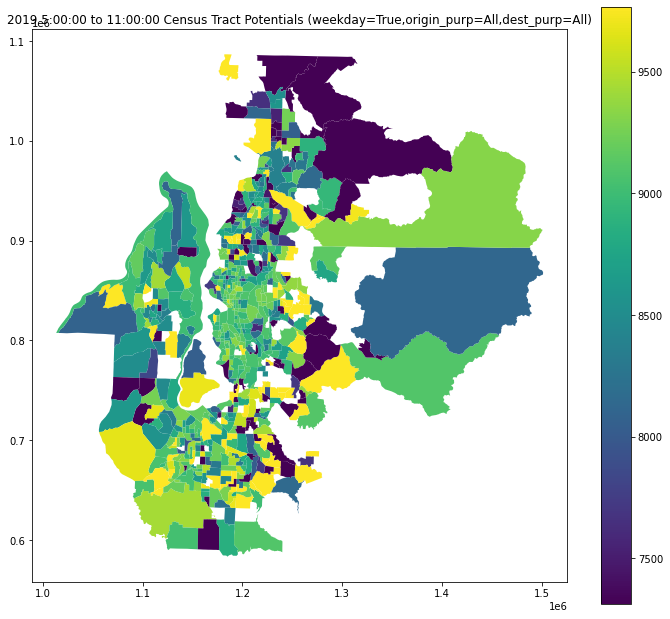

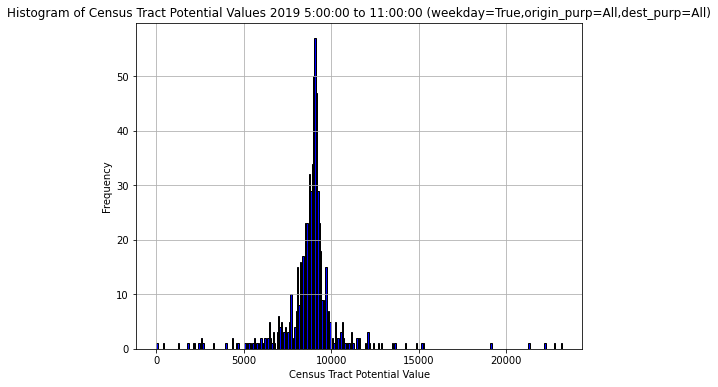

In [58]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=[5,11],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


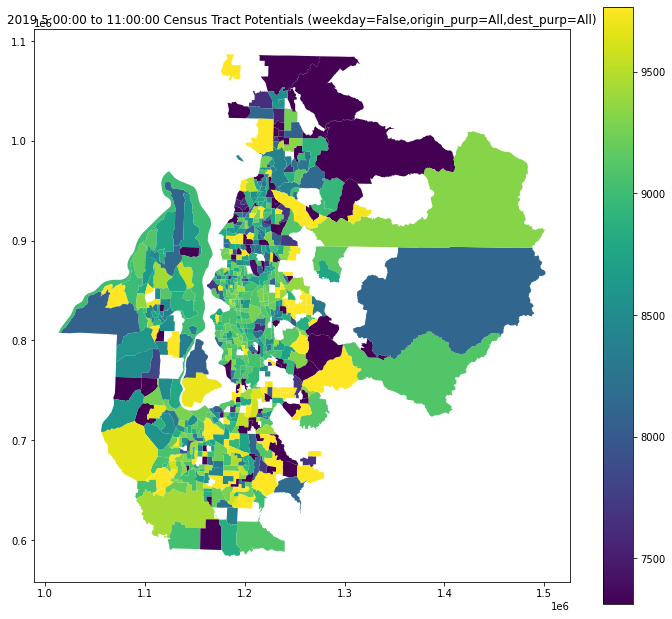

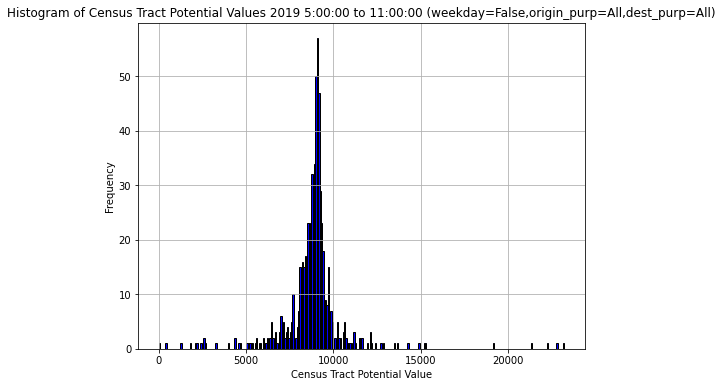

In [59]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=[5,11],weekday=False,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


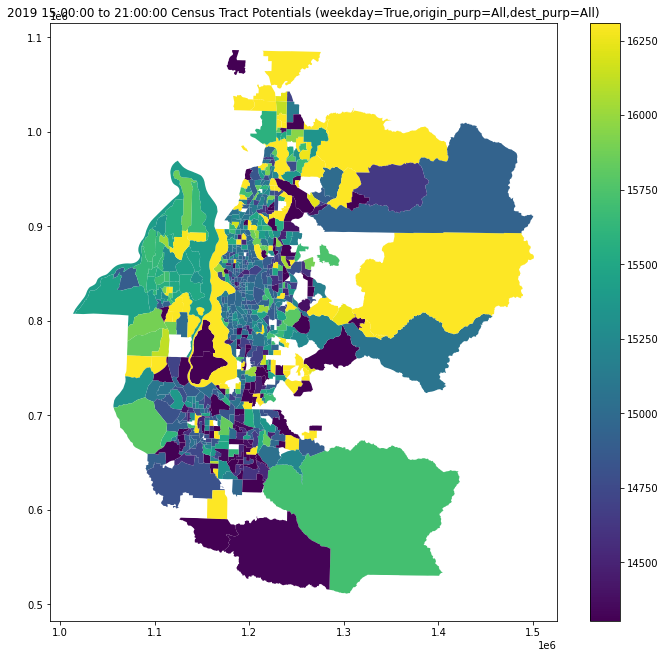

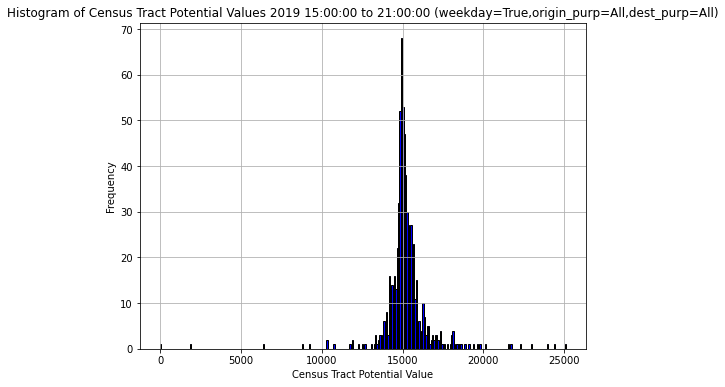

In [60]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=[15,21],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


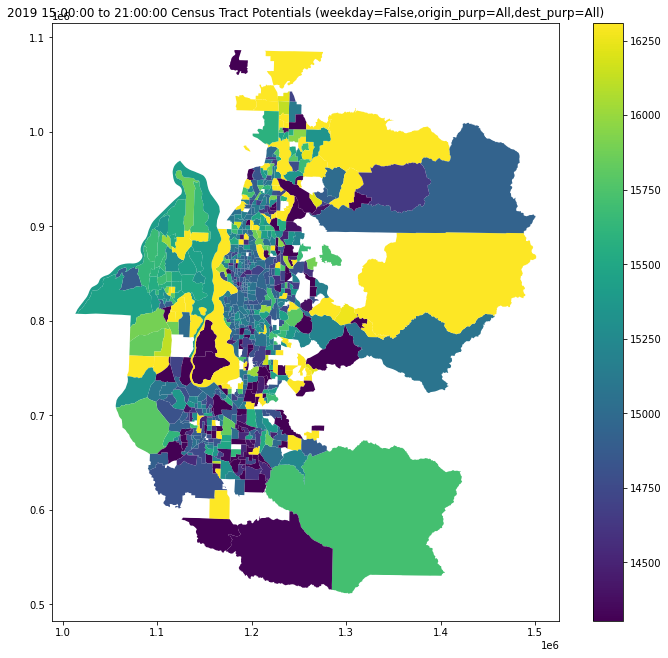

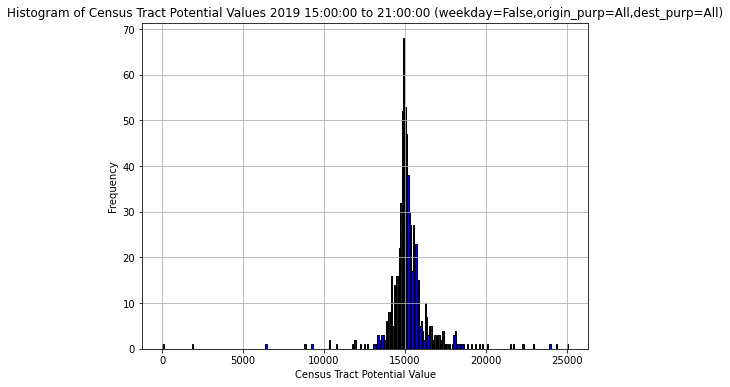

In [61]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=[15,21],weekday=False,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


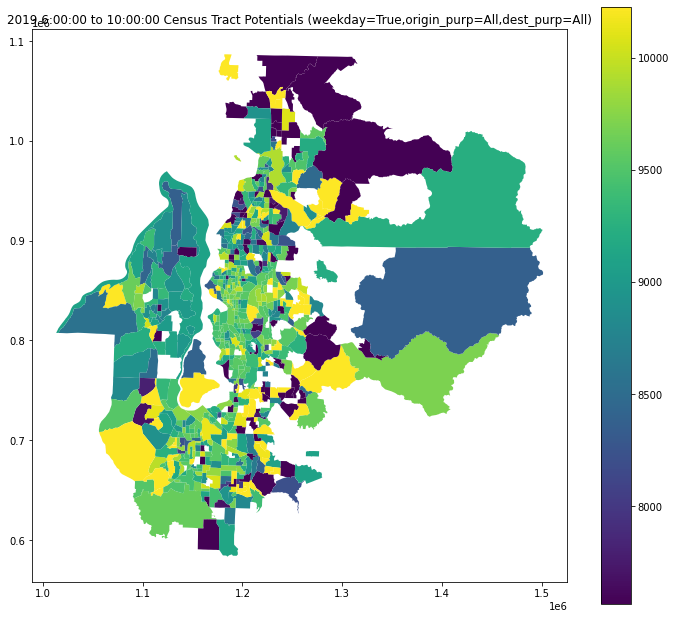

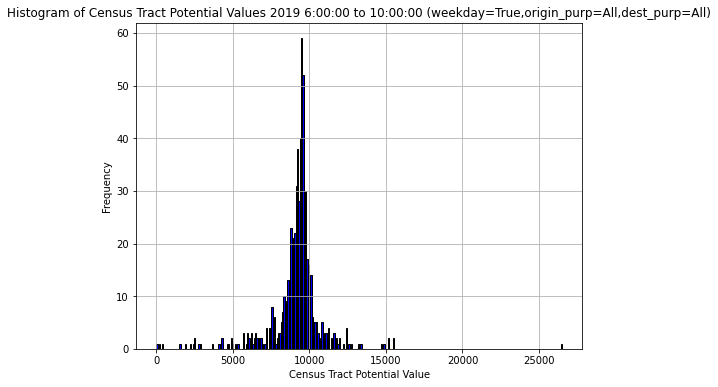

In [66]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=[6,10],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\2681526307.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


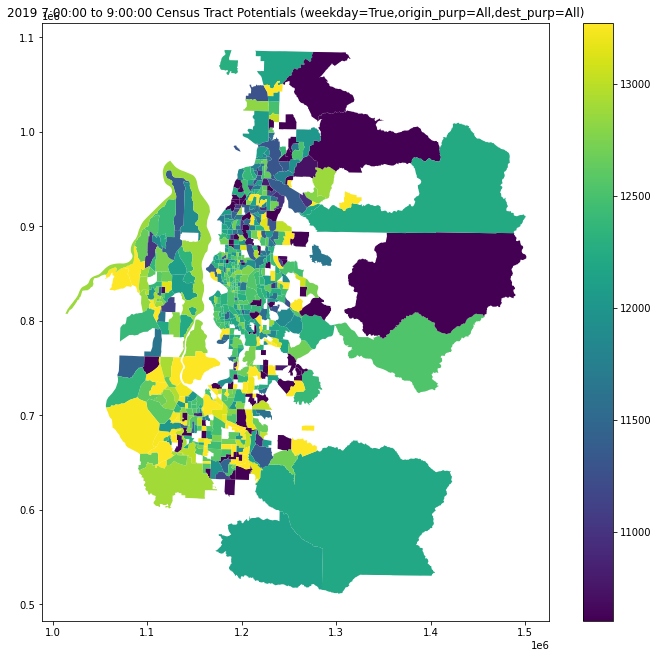

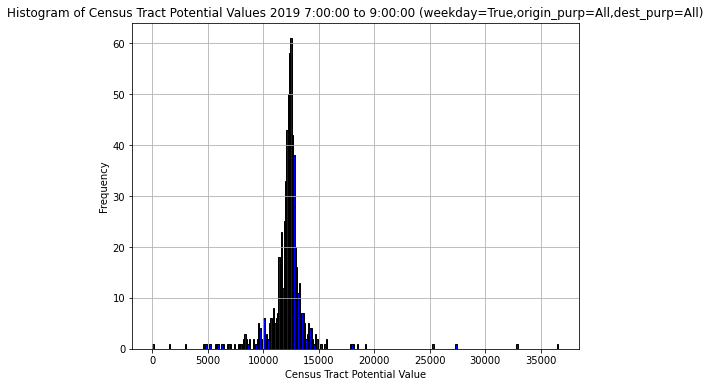

In [67]:
plot_urban_potential(year=2019,weight_column=None,depart_hour_range=[7,9],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


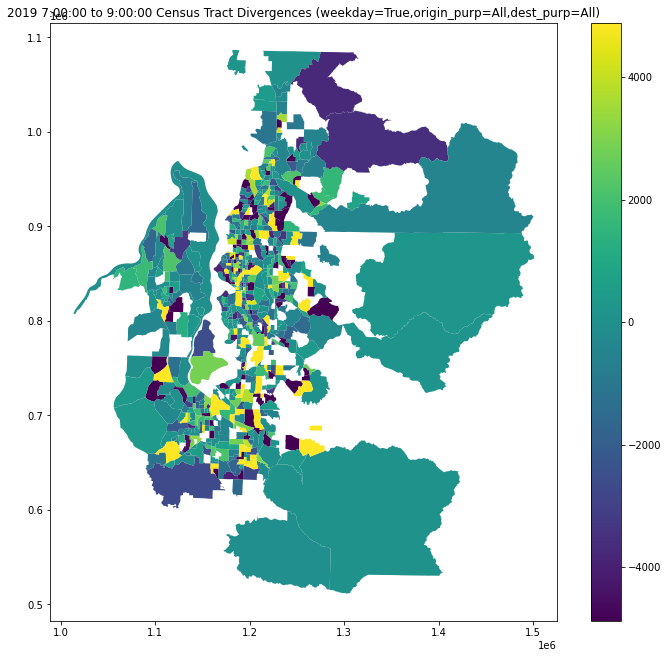

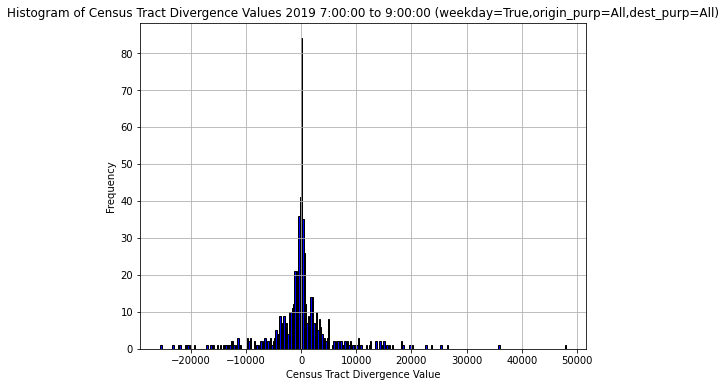

In [92]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=[7,9],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


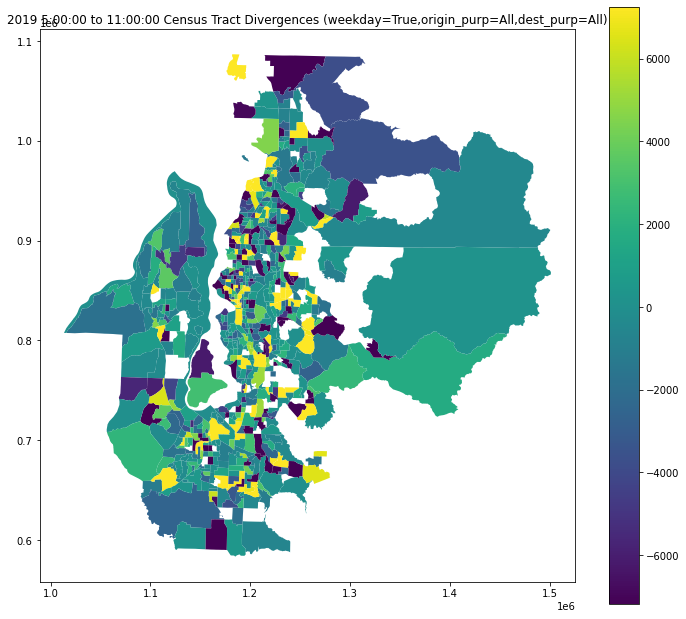

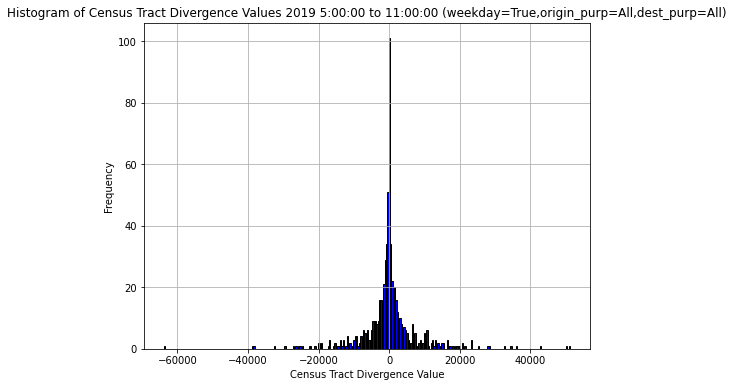

In [93]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=[5,11],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


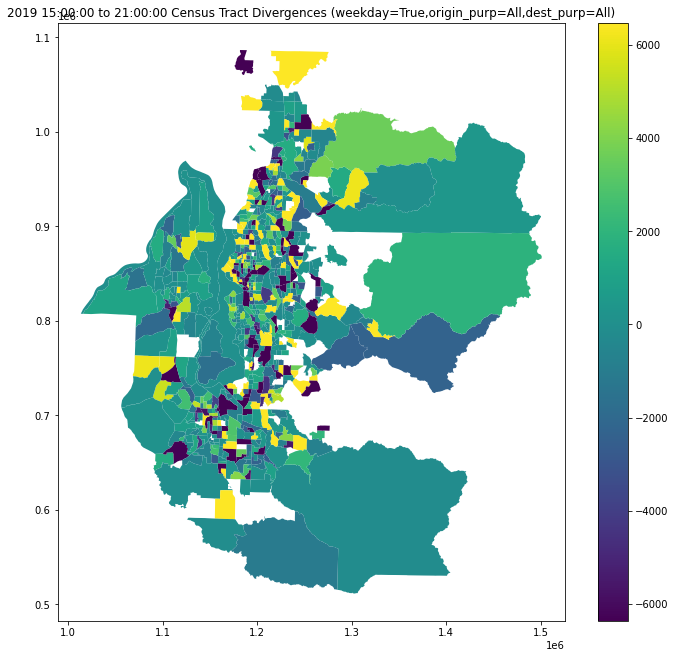

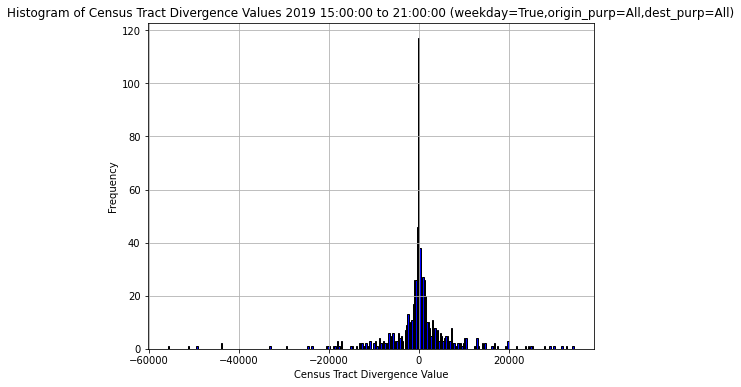

In [94]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=[15,21],weekday=True,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


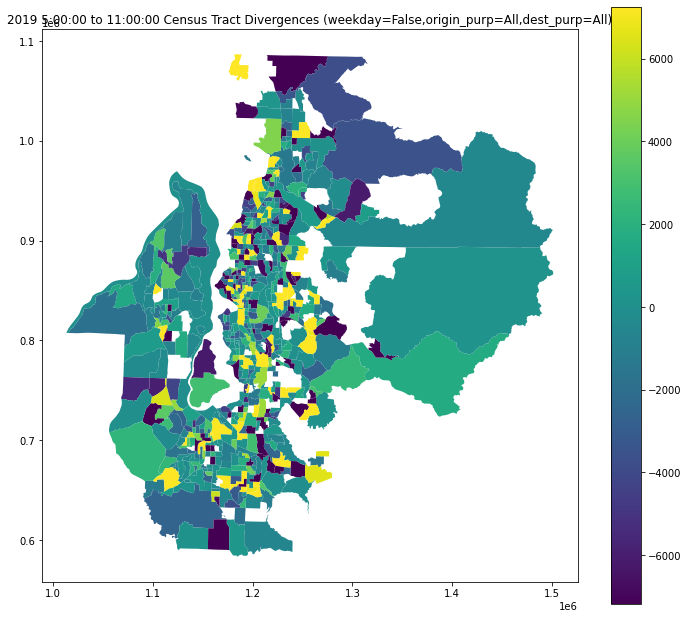

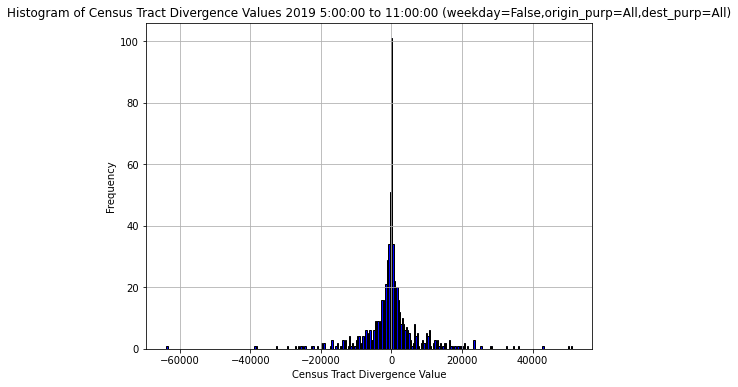

In [96]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=[5,11],weekday=False,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


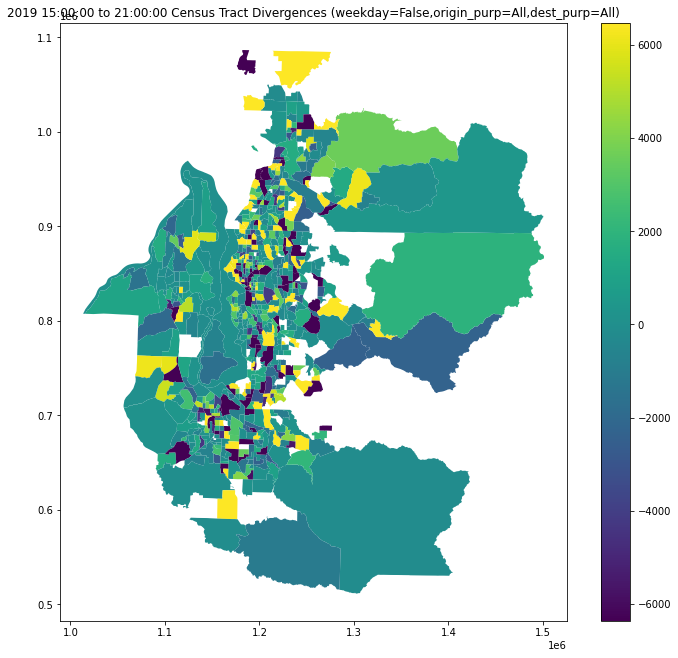

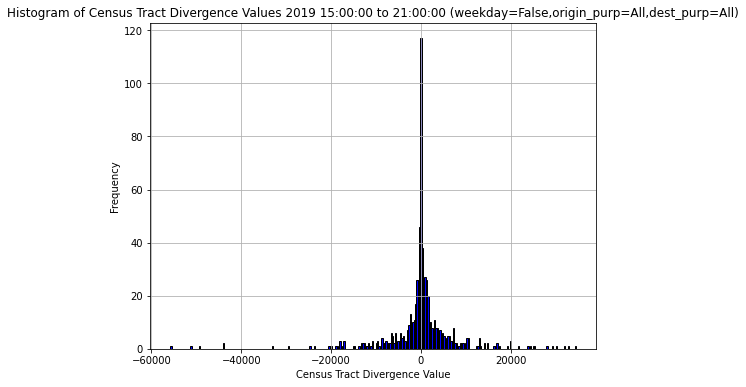

In [95]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=[15,21],weekday=False,origin_purp="All",dest_purp="All")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


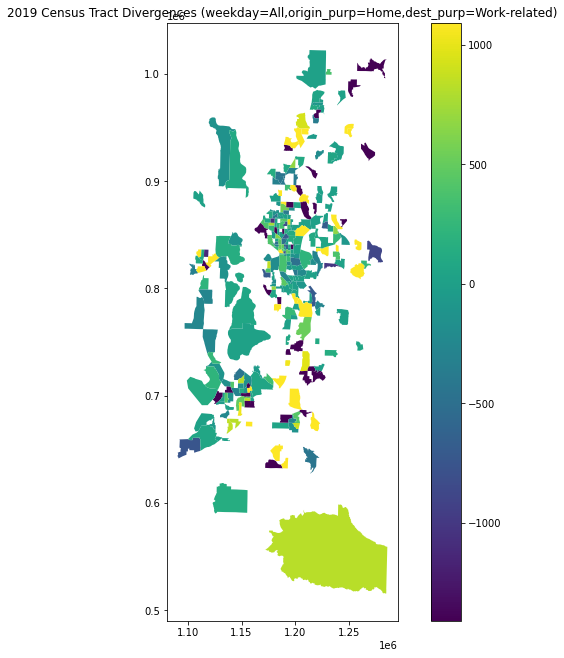

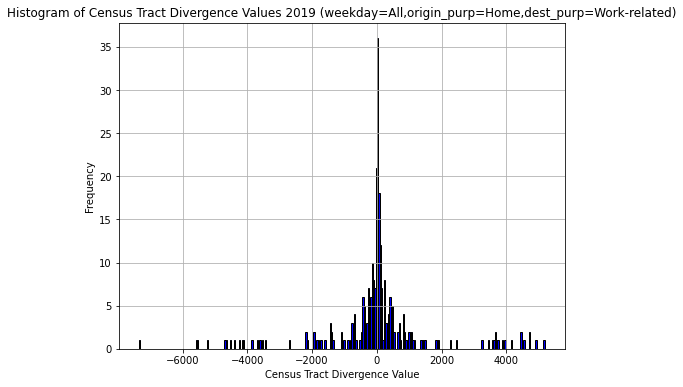

In [97]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=None,weekday="All",origin_purp="Home",dest_purp="Work-related")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:16: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3763837937.py:102: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


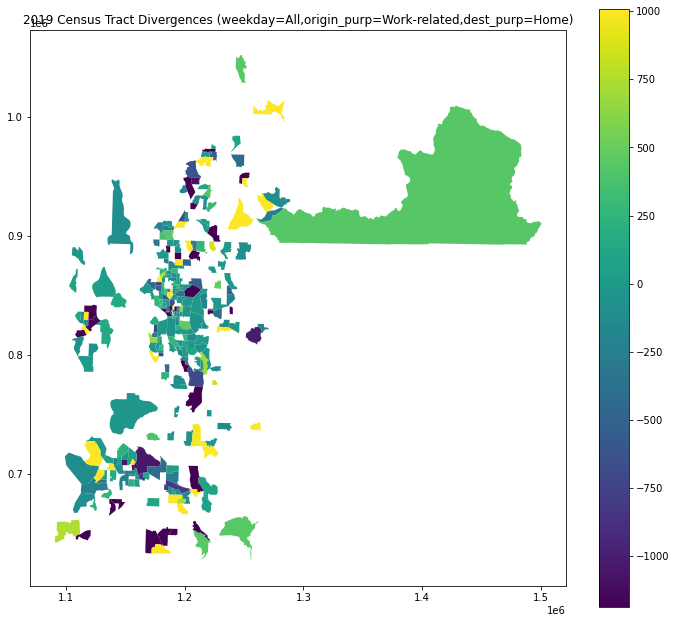

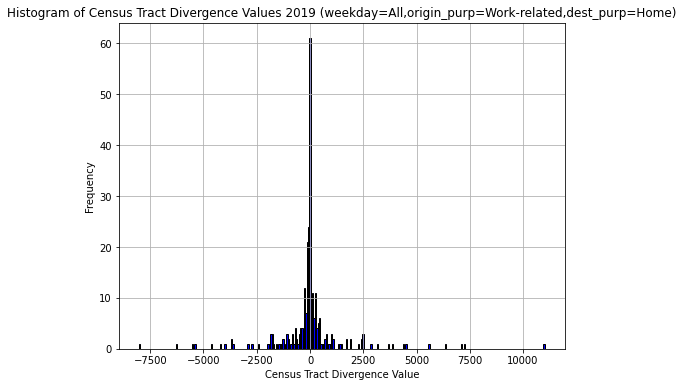

In [98]:
plot_urban_divergence(year=2019,weight_column=None,depart_hour_range=None,weekday="All",origin_purp="Work-related",dest_purp="Home")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


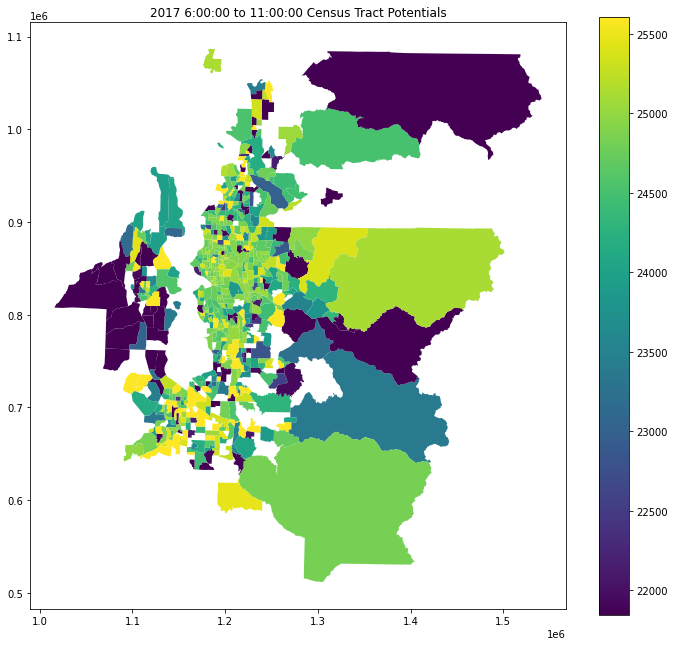

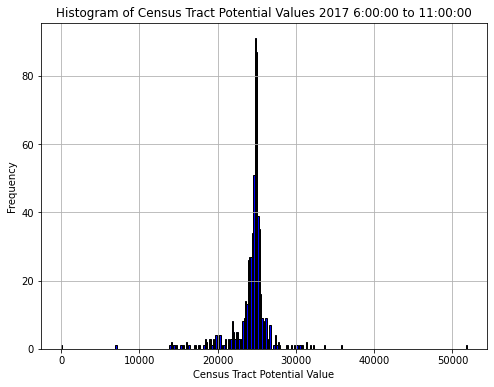

In [25]:
plot_urban_potential(year=2017,depart_hour_range=[6,11],weight_column="trip_weight_2017")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


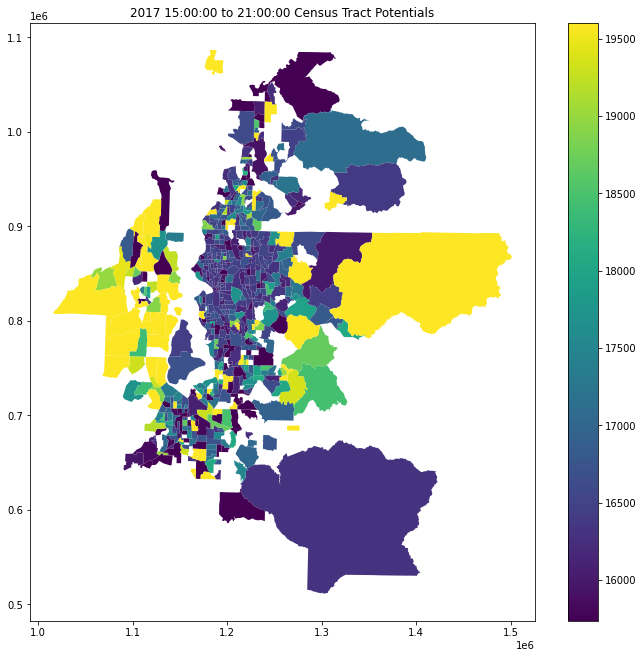

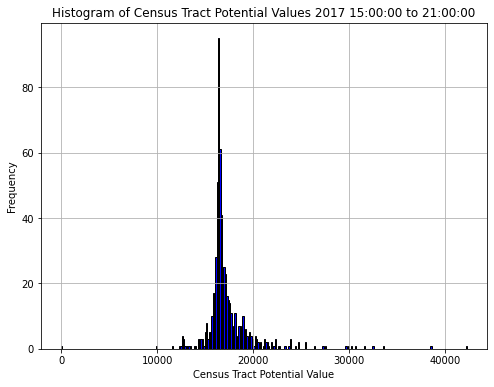

In [24]:
plot_urban_potential(year=2017,depart_hour_range=[15,21],weight_column="trip_weight_2017")

C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:11: DtypeWarning: Columns (5,8,25,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,52,68,69,73,75,76,79,86,87,88,89,90,91,92,93,94,95,96,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,130,131,132,133,134,135,136,137,138,139,140,142,154) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("psrc_trips.csv")
C:\Users\DELL\AppData\Local\Temp\ipykernel_6088\3554316348.py:74: FutureWarning: incidence_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  vertex_by_edge_boundary = nx.incidence_matrix(G, oriented=True).todense()


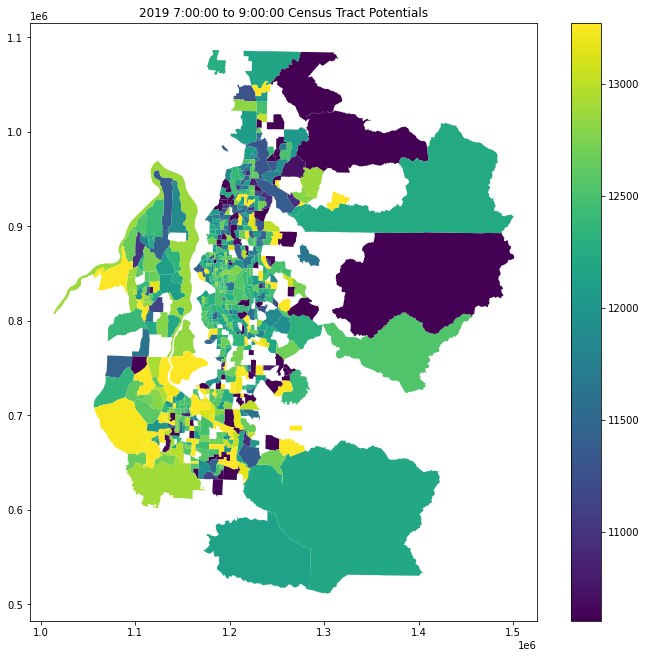

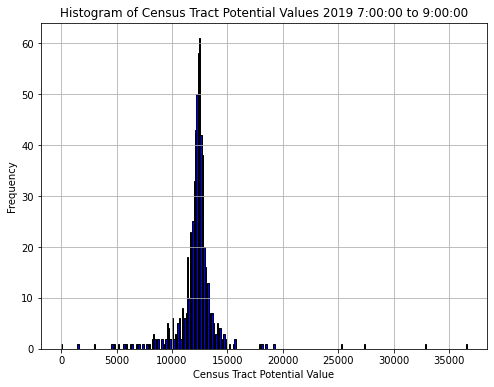

In [31]:
plot_urban_potential(year=2019,depart_hour_range=[7,9],weight_column="trip_weight_2019")

In [ ]:
plot_urban_potential(year=2019,depart_hour_range=[7,9],weight_column="trip_weight_2019")

percentage of trips with the same destination and origin

In [11]:
np.trace(table_2021)/np.sum(np.sum(table_2021))

0.19455254772161426